# Forest: tree crown delineation

## Context
### Purpose
Accurately delineating trees using a state of the art deep learning model.

### Modelling approach
An established deep learning model, **Mask R-CNN** is deployed to delineate tree crowns accurately. A pre-trained model is provided to predict the location and extent of tree crowns from a top-down RGB image, captured by drone, aircraft or satellite.

### Highlights
* Detectree advances the state-of-the-art in tree identification from RGB images by delineating exactly the extent of the tree crown.
* Our pre-trained model was developed using aircraft images of tropical forests in Malaysia.
* The model can be further trained using the user's own images.

### Authors
Sebastian Hickman, University of Cambridge, @shmh40
James Ball, University of Cambridge, @PatBall1
Toby Jackson, University of Cambridge


*The authors acknowledge the authors of the Detectron2 package which provides the Mask R-CNN architecture.*


## Install and load libraries

In [4]:
### install dependencies:

# may need to install opencv
# !pip install opencv-python

# install cython and associated packages
!pip3 -q install Cython cupy-cuda112 cupy-cuda102   # Probably only need one of these but it works so I'm gonna leave it for now.
!pip3 -q install pyyaml==5.1


# install an older version of pytorch that is compatible with detectron2

!pip -q install torch==1.7.1+cu110 torchvision==0.8.2+cu110 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html
!python -m pip -q install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu110/torch1.7/index.html

distutils: /opt/conda/include/python3.8/UNKNOWN
sysconfig: /opt/conda/include/python3.8
user = False
home = None
root = None
prefix = None
distutils: /opt/conda/include/python3.8/UNKNOWN
sysconfig: /opt/conda/include/python3.8
user = False
home = None
root = None
prefix = None
distutils: /opt/conda/include/python3.8/UNKNOWN
sysconfig: /opt/conda/include/python3.8
user = False
home = None
root = None
prefix = None
distutils: /opt/conda/include/python3.8/UNKNOWN
sysconfig: /opt/conda/include/python3.8
user = False
home = None
root = None
prefix = None
distutils: /opt/conda/include/python3.8/UNKNOWN
sysconfig: /opt/conda/include/python3.8
user = False
home = None
root = None
prefix = None
distutils: /opt/conda/include/python3.8/UNKNOWN
sysconfig: /opt/conda/include/python3.8
user = False
home = None
root = None
prefix = None
distutils: /opt/conda/include/python3.8/UNKNOWN
sysconfig: /opt/conda/include/python3.8
user = False
home = None
root = None
prefix = None
distutils: /opt/conda/inclu

In [5]:
## install geospatial libraries
!pip -q install geopandas
!pip -q install rasterio
!pip -q install fiona
!pip -q install shapely

distutils: /opt/conda/include/python3.8/UNKNOWN
sysconfig: /opt/conda/include/python3.8
user = False
home = None
root = None
prefix = None
distutils: /opt/conda/include/python3.8/UNKNOWN
sysconfig: /opt/conda/include/python3.8
user = False
home = None
root = None
prefix = None
distutils: /opt/conda/include/python3.8/UNKNOWN
sysconfig: /opt/conda/include/python3.8
user = False
home = None
root = None
prefix = None
distutils: /opt/conda/include/python3.8/UNKNOWN
sysconfig: /opt/conda/include/python3.8
user = False
home = None
root = None
prefix = None
distutils: /opt/conda/include/python3.8/UNKNOWN
sysconfig: /opt/conda/include/python3.8
user = False
home = None
root = None
prefix = None
distutils: /opt/conda/include/python3.8/UNKNOWN
sysconfig: /opt/conda/include/python3.8
user = False
home = None
root = None
prefix = None
distutils: /opt/conda/include/python3.8/UNKNOWN
sysconfig: /opt/conda/include/python3.8
user = False
home = None
root = None
prefix = None
distutils: /opt/conda/inclu

In [6]:
# Import torch and check versions and cuda availability, and resources
# GPU access is required to train the model

import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
!nvcc --version
!nvidia-smi

from IPython.display import display, clear_output

1.7.1+cu110 True
gcc (Ubuntu 9.3.0-17ubuntu1~20.04) 9.3.0
Copyright (C) 2019 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2021 NVIDIA Corporation
Built on Sun_Mar_21_19:15:46_PDT_2021
Cuda compilation tools, release 11.3, V11.3.58
Build cuda_11.3.r11.3/compiler.29745058_0
Wed Aug 25 13:29:08 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.181.07   Driver Version: 418.181.07   CUDA Version: 11.3     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla V100-SX

In [7]:
# Some basic imports:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# tensorboard?
#%load_ext tensorboard
#%tensorboard --logdir output

# necessary libraries
import pandas as pd
import numpy as np
import cv2
import random
import matplotlib.pyplot as plt
from PIL import Image
import os
import numpy as np
import json
import glob

# geospatial libraries
import geopandas as gpd
from geopandas.tools import sjoin

import rasterio
from rasterio.transform import from_origin
from rasterio.plot import show
from rasterio.mask import mask
import rasterio.features

import fiona
from fiona.crs import from_epsg

from shapely.geometry import shape, mapping, box
from shapely.geometry.multipolygon import MultiPolygon

#import pycrs
#import descartes


# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.structures import BoxMode

# Make sure the inevitable error messages are useful.
CUDA_LAUNCH_BLOCKING="1"

## Load data

#### Load an aerial raster of the location of interest

In [8]:
data = rasterio.open('/home/jovyan/lustre_scratch/sepilok_data/sepilok_2014_rgb/RCD105_MA14_21_orthomosaic_20141023_reprojected_full_res.tif')

# let's investigate the tiff, what is the shape? Bounds? Bands? CRS?

print('shape =', data.shape,',', data.bounds, 'and number of bands =', data.count, ',crs =', data.crs)

# show a plot of it too - this maybe slow depending on the size of your raster
#show(data)

shape = (40665, 84370) , BoundingBox(left=600543.5, bottom=644607.0, right=608980.5, top=648673.5) and number of bands = 4 ,crs = EPSG:32650


#### Clip the raster to a smaller tile to make predictions on

In [9]:
# defining a function we are going to use
def getFeatures(gdf):
        """Function to parse features from GeoDataFrame in such a manner that rasterio wants them"""
        return [json.loads(gdf.to_json())['features'][0]['geometry']]

In [10]:
# set the desired buffer, tile width, heght and resolution of the tiff tiles. Suggested values are given below. The buffer will be affected by the area of tree crowns in your region of forest.

buffer = 20
tile_width = 100
tile_height = 100
resolution = 0.1 # in metres per pixel
scaling = 1/resolution  # scaling parameter to transform the shapefile coordinates so they match the png

# define the origin of the tile of our raster that we want to predict on

minx = 603000
miny = 646900
    
# define the bounding box of the whole tile, including the buffer
bbox = box(minx-buffer, miny-buffer, minx+tile_width+buffer, miny+tile_height+buffer)
# define the bounding box of the tile, excluding the buffer (hence selecting just the central part of the tile)
bbox_central = box(minx, miny, minx+tile_width, miny+tile_height)
# turn the bounding boxes into geopandas DataFrames
geo = gpd.GeoDataFrame({'geometry': bbox}, index=[0], crs=from_epsg(32650))
geo_central = gpd.GeoDataFrame({'geometry': bbox_central}, index=[0], crs=from_epsg(32650))
    
### here we are cropping the tiff to the bounding box of the tile we want
coords = getFeatures(geo)
#print(coords)
    
# define the tile as a mask of the whole tiff with just the bounding box
out_img, out_transform = mask(data, shapes=coords, crop=True)
    
# copy the metadata
out_meta = data.meta.copy()
#print(out_meta)
epsg_code = int(data.crs.data['init'][5:])
#print(epsg_code)
   
# update the metadata
out_meta.update({"driver": "GTiff",
                 "height": out_img.shape[1],
                 "width": out_img.shape[2],
                 "transform": out_transform
                 })
    
# here we are saving the tile as a new tiff, named by the origin of the tile
out_tif = '/home/jovyan/lustre_scratch/sepilok_data/spare_tiles/tile_'+str(minx)+'_'+str(miny)+'.tif'
with rasterio.open(out_tif, "w", **out_meta) as dest:
                    dest.write(out_img)
    
# read in the tile we have just saved
clipped = rasterio.open('/home/jovyan/lustre_scratch/sepilok_data/spare_tiles/tile_'+str(minx)+'_'+str(miny)+'.tif')
# read it as an array
arr = clipped.read()
    
# check the shape of the tile if you wish
#print(arr.shape)
    
# each band of the tiled tiff is a colour!
R = arr[0]
G = arr[1]
B = arr[2]
    
# stack up the bands in an order appropriate for saving with cv2, then rescale to the correct 0-255 range for cv2
    
rgb = np.dstack((R,G,B)) # BGR for cv2
rgb_rescaled = 255*rgb/65535 # scale to image
    
# save this as png, named with the origin of the specific tile
cv2.imwrite('/home/jovyan/lustre_scratch/sepilok_data/spare_pngs/tile_'+str(minx)+'_'+str(miny)+'.png', rgb_rescaled)

/opt/conda/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


True

#### Now read in and display this png

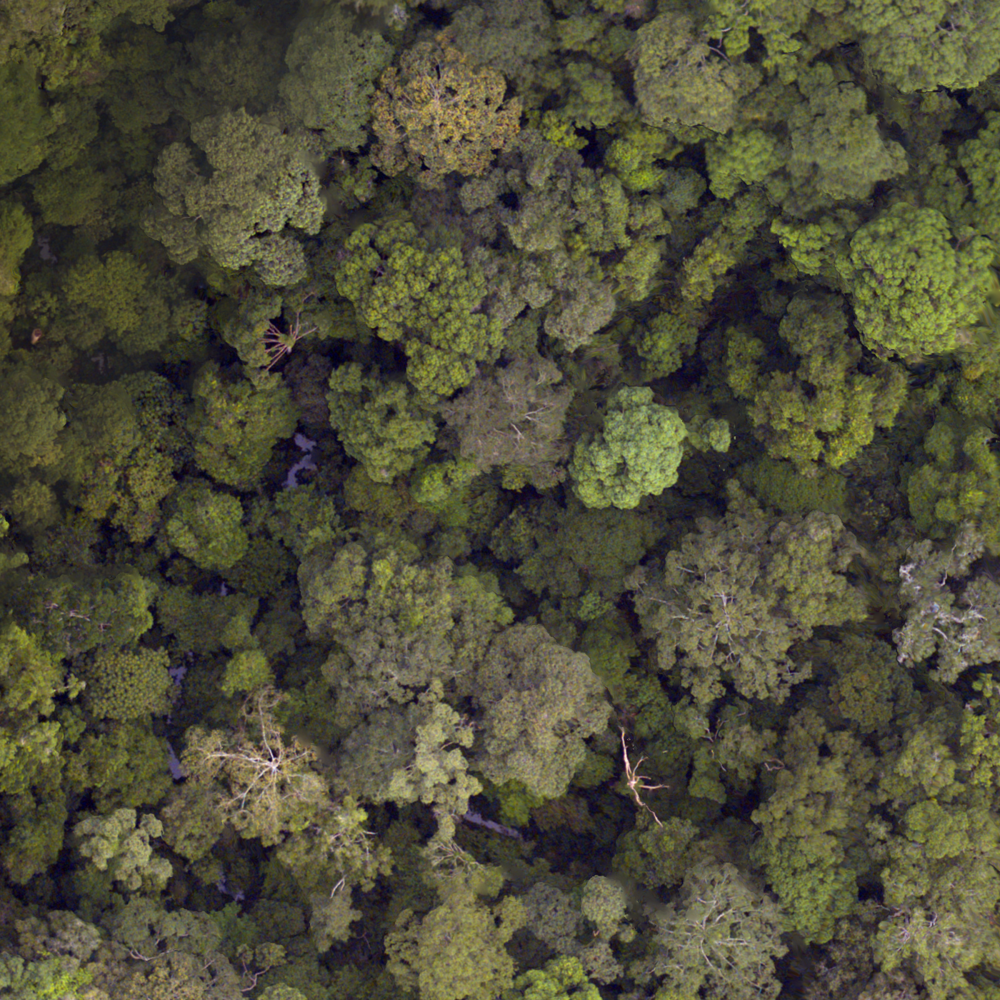

In [11]:
filepath = "/home/jovyan/lustre_scratch/sepilok_data/spare_pngs/tile_603000_646900.png"
im = cv2.imread(filepath)
display(Image.fromarray(im))

## Modelling

In [12]:
# Setup to predict on new images, here setting up for the trees_test dataset, but can also use this setup
# for predicting on individual images as seen 2 cells down

from detectron2.utils.visualizer import ColorMode
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_101_FPN_3x.yaml"))
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

### path to the saved pre-trained model weights
cfg.MODEL.WEIGHTS = '/home/jovyan/detectron2_live/train_test/output/model_final.pth'

# set confidence threshold at which we predict
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.15

predictor = DefaultPredictor(cfg)

## Outputs

#### First generate an image showing the predictions from detectree

/opt/conda/lib/python3.8/site-packages/detectron2/modeling/roi_heads/fast_rcnn.py:154: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  filter_inds = filter_mask.nonzero()


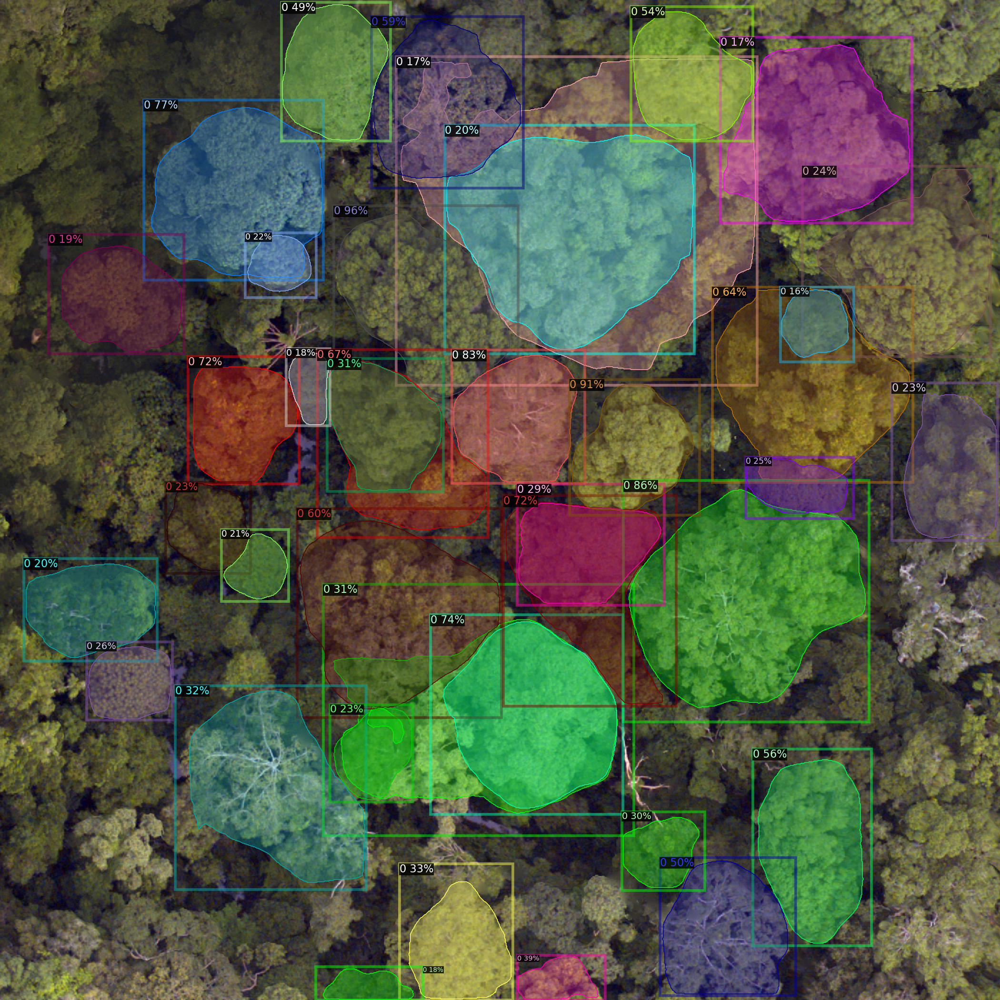

In [13]:
# output an image of predicted crowns

outputs = predictor(im)
v = Visualizer(im[:, :, ::-1], scale=1.5, instance_mode=ColorMode.IMAGE_BW)   # remove the colors of unsegmented pixels
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
image = cv2.cvtColor(v.get_image()[:, :, :], cv2.COLOR_BGR2RGB)
display(Image.fromarray(image))

#### Now convert these predictions back into geospatial files that can be examined in GIS software

In [14]:
# create a raster file of the predictions, transformed into the correct coordinate system

filepath = "/home/jovyan/lustre_scratch/sepilok_data/spare_pngs/tile_603000_646900.png"
im = cv2.imread(filepath)
outputs = predictor(im)

# retrieve predictions
mask_array = outputs['instances'].pred_masks.cpu().numpy()
    
# retrieve confidence scores 
mask_array_scores = outputs['instances'].scores.cpu().numpy()
    
num_instances = mask_array.shape[0]
#print(num_instances)
mask_array_instance = []
# create an array of the right shape
output = np.zeros_like(mask_array) 
#print('output',output.shape)

mask_array_instance.append(mask_array)
output = np.where(mask_array_instance[0] == True, 255, output)
#print(output)
#print(mask_array_instance)
fresh_output = output.astype(np.float)
#print(fresh_output.shape)
x_scaling = 140/fresh_output.shape[1]
y_scaling = 140/fresh_output.shape[2]
# this is an affine transform. This needs to be altered significantly.
transform = from_origin(int(filepath[-17:-11])-20, int(filepath[-10:-4])+120, y_scaling, x_scaling)

new_dataset = rasterio.open('/home/jovyan/lustre_scratch/folder/new_predicted_polygons_'+filepath[-17:-4]+'.tif', 'w', driver='GTiff',
                             height = fresh_output.shape[1], width = fresh_output.shape[2], count = fresh_output.shape[0],
                             dtype=str(fresh_output.dtype),
                             crs='+proj=utm +zone=50 +datum=WGS84 +units=m +no_defs',  
                             transform=transform)

new_dataset.write(fresh_output)
new_dataset.close()


In [16]:
# just checking the schema here - cell below is the key one

for filepath in glob.iglob('/home/jovyan/lustre_scratch/folder/*.tif'):
    print(filepath)
    with rasterio.open(filepath) as src:
        shp_schema = {'geometry': 'MultiPolygon','properties': {'pixelvalue': 'int', 'score': 'float'}}
    
        print(src.crs, src.count)
        print(shp_schema)

/home/jovyan/lustre_scratch/folder/new_predicted_polygons_603000_646900.tif
EPSG:32650 39
{'geometry': 'MultiPolygon', 'properties': {'pixelvalue': 'int', 'score': 'float'}}


In [22]:
### Make looped version of above script
### THIS WORKS BRILLIANTLY
### It reads in a stack raster of all the predictions, and outputs n shapefiles, where n 
### is the number of predictions for that particular image. 
### We can then merge all these predictions. 

#### extract confidence from the predictions to include as a column in the shapefile

# Another way to polygonise all the bands of my raster

import numpy as np
import fiona
import rasterio
import rasterio.features
from shapely.geometry import shape, mapping
from shapely.geometry.multipolygon import MultiPolygon
#from shapely.geometry import Polygon


# Read input band with Rasterio
for filepath in glob.iglob('/home/jovyan/lustre_scratch/folder/*.tif'):
    print(filepath)
    with rasterio.open(filepath) as src:
        shp_schema = {'geometry': 'MultiPolygon','properties': {'pixelvalue': 'int', 'score': 'float'}}
    
        crs = src.crs
        #all_shapes = []
        for i in range(src.count):
            src_band = src.read(i+1)
            src_band = np.float32(src_band)
            conf = mask_array_scores[i]
            print(conf)
            # Keep track of unique pixel values in the input band
            unique_values = np.unique(src_band)
            # Polygonize with Rasterio. `shapes()` returns an iterable
            # of (geom, value) as tuples
            shapes = list(rasterio.features.shapes(src_band, transform=src.transform))
            #all_shapes.append(shapes)

# simplify here

# Get a list of all polygons for a given pixel value
# and create a MultiPolygon geometry with shapely.
# Then write the record to an output shapefile with fiona.
# We make use of the `shape()` and `mapping()` functions from
# shapely to translate between the GeoJSON-like dict format
# and the shapely geometry type.
##### Don't forget to add this folder here!
### change ' w' to 'a' to append....
            with fiona.open('/home/jovyan/lustre_scratch/folder/testing_w/new_predicted_polygons_'+filepath[-17:-4]+'_'+str(i)+'.shp', 'w', 'ESRI Shapefile', shp_schema, crs) as shp:
                for pixel_value in unique_values:
                    polygons = [shape(geom) for geom, value in shapes
                                if value == 255.0]
                    multipolygon = MultiPolygon(polygons)
                    # this simplify thing isn't needed...doesn't work and it is fast to save the stuff on the whole
                    #multipolygon = multipolygon_a.simplify(0.1, preserve_topology=False)
                    shp.write({
                        'geometry': mapping(multipolygon),
                        'properties': {'pixelvalue': int(pixel_value), 'score': float(conf)}
                            })

/home/jovyan/lustre_scratch/folder/new_predicted_polygons_603000_646900.tif
0.95917755
0.9130143
0.85546863
0.8279309
0.7710072
0.7357265
0.72386557
0.72344804
0.674389
0.6412531
0.6015422
0.5946187
0.5607261
0.53654397
0.49711952
0.4909645
0.3931537
0.32749587
0.3221164
0.3134057
0.3107108
0.30313745
0.29341176
0.25813225
0.24971537
0.24122785
0.23282549
0.23153627
0.23084359
0.21962611
0.20535953
0.19714735
0.19571109
0.1913415
0.17716978
0.17596476
0.17423484
0.1681014
0.16331632


In [23]:
### need to zip them up here

# the first filepath is the name of the zipfile you want to make, the second filepath is the folder of predictions

import shutil

shutil.make_archive("/home/jovyan/lustre_scratch/folder/outputs_255", "zip", "/home/jovyan/lustre_scratch/folder/testing_w/")

'/home/jovyan/lustre_scratch/folder/outputs_255.zip'

### Experimentation below this point

In [77]:
### this doesn't work very well...................

from shapely.geometry import shape

geom = [shape(j) for j in all_shapes[1]]

#gpd.GeoDataFrame({'geometry':geom})

AttributeError: 'tuple' object has no attribute 'get'

In [27]:
### experimenting here with this clever all_shapes idea
### which may work with a bit more effort - but there is something in having an individual shapefile
### for each tree, to be honest.

import numpy as np
import fiona
import rasterio
import rasterio.features
from shapely.geometry import shape, mapping
from shapely.geometry.multipolygon import MultiPolygon
#from shapely.geometry import Polygon


# Read input band with Rasterio
for filepath in glob.iglob('/home/jovyan/lustre_scratch/folder/*.tif'):
    print(filepath)
    with rasterio.open(filepath) as src:
        shp_schema = {'geometry': 'MultiPolygon','properties': {'pixelvalue': 'int', 'score': 'float'}}
    
        crs = src.crs
        all_shapes = []
        for i in range(src.count):
            src_band = src.read(i+1)
            src_band = np.float32(src_band)
            conf = mask_array_scores[i]
            print(conf)
            # Keep track of unique pixel values in the input band
            unique_values = np.unique(src_band)
            # Polygonize with Rasterio. `shapes()` returns an iterable
            # of (geom, value) as tuples
            shapes = list(rasterio.features.shapes(src_band, transform=src.transform))
            all_shapes.append(shapes)

/home/jovyan/lustre_scratch/folder/new_predicted_polygons_603000_646900.tif
0.95917755
0.9130143
0.85546863
0.8279309
0.7710072
0.7357265
0.72386557
0.72344804
0.674389
0.6412531
0.6015422
0.5946187
0.5607261
0.53654397
0.49711952
0.4909645
0.3931537
0.32749587
0.3221164
0.3134057
0.3107108
0.30313745
0.29341176
0.25813225
0.24971537
0.24122785
0.23282549
0.23153627
0.23084359
0.21962611
0.20535953
0.19714735
0.19571109
0.1913415
0.17716978
0.17596476
0.17423484
0.1681014
0.16331632


In [37]:
### this doesn't work

with fiona.open('/home/jovyan/lustre_scratch/folder/testing_w/new_predicted_polygons_'+filepath[-17:-4]+'.shp', 'w', 'ESRI Shapefile', shp_schema, crs) as shp:
    polygons = []
    for j in range(len(all_shapes)):
        polygon = [shape(geom) for geom, value in all_shapes[j] 
                    if value == 255.0]
        polygons.append(polygon)
    multipolygon = MultiPolygon(polygons)
        #multipolygon = multipolygon_a.simplify(0.1, preserve_topology=False)
    shp.write({
               'geometry': mapping(multipolygon),
               'properties': {'pixelvalue': int(pixel_value), 'score': float(conf)}
               })

AttributeError: 'list' object has no attribute '_ndim'

In [ ]:
with rasterio.open(filepath) as src:
    shp_schema = {'geometry': 'MultiPolygon','properties': {'pixelvalue': 'int'}}
    
    crs = src.crs
    #for i in range(src.count):
    src_band = src.read(1)
    src_band = np.float32(src_band)
        #score = array[i]
        #print(src_band.dtype)
        # Keep track of unique pixel values in the input band
    unique_values = np.unique(src_band)
        # Polygonize with Rasterio. `shapes()` returns an iterable
        # of (geom, value) as tuples
    shapes = list(rasterio.features.shapes(src_band, transform=src.transform))



# simplify here

# Get a list of all polygons for a given pixel value and create a MultiPolygon geometry with shapely.
# Then write the record to an output shapefile with fiona
# We make use of the `shape()` and `mapping()` functions from shapely to translate between the GeoJSON-like dict format
# and the shapely geometry type.
##### Don't forget to add this folder here!
### change ' w' to 'a' to append....


    for pixel_value in unique_values:
        polygons = [shape(geom) for geom, value in shapes if value == pixel_value]
        multipolygon = MultiPolygon(polygons)

In [ ]:



# Read input band with Rasterio
tiff_filepath = '/home/jovyan/lustre_scratch/folder/10_predicted_polygons_603000_646900.tif'
    #print(filepath)
with rasterio.open(filepath) as src:
    shp_schema = {'geometry': 'MultiPolygon','properties': {'pixelvalue': 'int'}}
    
    crs = src.crs
    for i in range(src.count):
        src_band = src.read(i+1)
        src_band = np.float32(src_band)
            #score = array[i]
            #print(src_band.dtype)
            # Keep track of unique pixel values in the input band
        unique_values = np.unique(src_band)
            # Polygonize with Rasterio. `shapes()` returns an iterable
            # of (geom, value) as tuples
        shapes = list(rasterio.features.shapes(src_band, transform=src.transform))


# simplify here

# Get a list of all polygons for a given pixel value
# and create a MultiPolygon geometry with shapely.
# Then write the record to an output shapefile with fiona.
# We make use of the `shape()` and `mapping()` functions from
# shapely to translate between the GeoJSON-like dict format
# and the shapely geometry type.
##### Don't forget to add this folder here!
### change ' w' to 'a' to append....
        with fiona.open('/home/jovyan/lustre_scratch/folder/10_predicted_polygons_'+filepath[-17:-4]+'_'+str(i)+'.shp', 'w', 'ESRI Shapefile', shp_schema, crs) as shp:
            for pixel_value in unique_values:
                polygons = [shape(geom) for geom, value in shapes
                            if value == pixel_value]
                multipolygon = MultiPolygon(polygons)
                multipolygon = multipolygon.simplify(0.1, preserve_topology=False)
                shp.write({
                        'geometry': mapping(multipolygon),
                        'properties': {'pixelvalue': int(pixel_value)},
                        'score': {mask_array_scores[i]}
                            })

In [ ]:
### read in the raster stack of all the predictions, and output a shapefile of all the predictions

#### extract confidence from the predictions to include as a column in the shapefile

# Another way to polygonise all the bands of my raster

# Read input band with Rasterio
tiff_filepath = '/home/jovyan/lustre_scratch/folder/10_predicted_polygons_603000_646900.tif'
with rasterio.open(filepath) as src:
    shp_schema = {'geometry': 'MultiPolygon','properties': {'pixelvalue': 'int'}}
    
    crs = src.crs
    for i in range(src.count):
        src_band = src.read(i+1)
        src_band = np.float32(src_band)
        #score = array[i]
        #print(src_band.dtype)
        # Keep track of unique pixel values in the input band
        unique_values = np.unique(src_band)
        # Polygonize with Rasterio. `shapes()` returns an iterable
        # of (geom, value) as tuples
        shapes = list(rasterio.features.shapes(src_band, transform=src.transform))



# simplify here

# Get a list of all polygons for a given pixel value and create a MultiPolygon geometry with shapely.
# Then write the record to an output shapefile with fiona
# We make use of the `shape()` and `mapping()` functions from shapely to translate between the GeoJSON-like dict format
# and the shapely geometry type.
##### Don't forget to add this folder here!
### change ' w' to 'a' to append....

        with fiona.open('/home/jovyan/lustre_scratch/folder/predicted_crowns_'+filepath[-17:-4]+'_'+str(i)+'.shp', 'w', 'ESRI Shapefile', shp_schema, crs) as shp:
            for pixel_value in unique_values:
                    polygons = [shape(geom) for geom, value in shapes
                                if value == pixel_value]
                    multipolygon_full = MultiPolygon(polygons)
                    multipolygon = multipolygon.simplify(0.1, preserve_topology=False)
                    shp.write({
                        'geometry': mapping(multipolygon),
                        'properties': {'pixelvalue': int(pixel_value)},
                        'score': mask_array_scores[i]}
                        )

In [ ]:
#### the shapefile can then be downloaded and loaded into GIS software

## Summary

In [ ]:
#### We have read in a raster, chosen a tile and made predictions on it. These predictions can then be transformed to shapefiles and examined in GIS software!